In [13]:
%load_ext autoreload
%autoreload 2
import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import dnnlib
import pickle
import matplotlib.pyplot as plt
from Utils.basic_utils import *
from Utils.cfg_utils import *
from Utils.cpc_utils import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
device = torch.device('cuda')

## In this notebook, we will demonstrate that in the linear regime (high to moderate noise level), linear CFG leads to similar guiding effects as the actual nonlinearCFG.

### 1. First, we will visualize CFG's effects on individual time steps, i.e., we only apply CFG at a single selected time step along the reverse sampling trajectory.

In [15]:
torch.manual_seed(0)
rank = 3*64*64
# Load conditional EDM model
net_cond_pkl = 'https://nvlabs-fi-cdn.nvidia.com/edm/pretrained/edm-imagenet-64x64-cond-adm.pkl'
with dnnlib.util.open_url(net_cond_pkl) as f:
    net_cond = pickle.load(f)['ema'].to(device)

# Load unconditional EDM model, this one is trained by ourselves from scratch
net_uncond_pkl = 'Imagenet_weights/network-snapshot-048000.pkl'

with dnnlib.util.open_url(net_uncond_pkl) as f:
    net_uncond = pickle.load(f)['ema'].to(device)

# Build unconditional linear model
mean_path_uncond = 'Covariance_ImageNetGenerated/uncond/mean.pt'
covariance_path_uncond = 'Covariance_ImageNetGenerated/uncond/covariance.pt' 
mean_uncond = torch.load(mean_path_uncond, weights_only=False)
mean_uncond = mean_uncond.to(device)
U, S, Vh = torch.load(covariance_path_uncond, weights_only=False)
U = U.to(device)
S = S.to(device)
Vh = Vh.to(device)
covariance_uncond = U, S, Vh
Gaussian_model_uncond = multi_gaussian(mean_uncond, covariance_uncond, low_rank=rank).to(device)

class_idx = 933 #[0, 31, 64, 207, 430, 483, 504, 817, 933, 947] # 10 randomly selected classes from ImageNet (1000 classes in total)

# Build conditional linear model
mean_path_cond = 'Covariance_ImageNetGenerated/class_'+str(class_idx)+'/mean.pt'
covariance_path_cond = 'Covariance_ImageNetGenerated/class_'+str(class_idx)+'/covariance.pt'
mean_cond = torch.load(mean_path_cond, weights_only=False)
mean_cond = mean_cond.to(device)
U, S, Vh = torch.load(covariance_path_cond, weights_only=False)
U = U.to(device)
S = S.to(device)
Vh = Vh.to(device)
covariance_cond = U, S, Vh
Gaussian_model_cond = multi_gaussian(mean_cond, covariance_cond, low_rank=rank).to(device)
    
num_show = 10
num_steps = 20
num_channels = 3
resolution = 64
latents = torch.randn(num_show, num_channels, resolution, resolution).to(device)
guidance_strength = 4
    
# Standard (naive) conditional generation with EDM
sigma_list, intermediates_EDM_cond, denoised_intermediates_EDM_cond = generate_image(net_cond, latents, num_steps=num_steps, class_idx=class_idx, device=device)

# Get EDM unconditional version of the EDM conditional sampling trajectory
denoised_intermediates_EDM_uncond = get_uncond_from_cond(net_uncond, intermediates_EDM_cond, sigma_list, num_steps=num_steps)

# Get Linear unconditional version of the EDM conditional sampling trajectory
denoised_intermediates_Gaussian_uncond = get_uncond_from_cond(Gaussian_model_uncond, intermediates_EDM_cond, sigma_list, num_steps=num_steps)

# Get Linear conditional version of the EDM unconditional sampling trajectory
denoised_intermediates_Gaussian_cond = get_uncond_from_cond(Gaussian_model_cond, intermediates_EDM_cond, sigma_list, num_steps=num_steps)

# Now, apply nonlinear and linear CFG at each individual time step
sample_list_edm = []
sample_list_linear = []
    
guidance_scale = 15
for i in range(len(sigma_list)-1):
    timestep = i
    modified_timestep = timestep + 1 # the guidance calculated at timestep i is applied to the sampling step at time step i+1
    actual_guidance_scale = guidance_scale * (sigma_list[timestep] - sigma_list[timestep+1]) / sigma_list[timestep] # here the guidance is built using the notation of 'denoised input', we scale the guidance with a time dependent constant to convert it into the context of 'score'. Score and denoised output differ by a time dependent constant scale
    guidance_direction_EDM = denoised_intermediates_EDM_cond[i] - denoised_intermediates_EDM_uncond[i]
    guidance_direction_EDM = torch.tensor(guidance_direction_EDM).to(device)
    
    guidance_direction_linear = denoised_intermediates_Gaussian_cond[i] - denoised_intermediates_Gaussian_uncond[i]
    guidance_direction_linear = guidance_direction_linear.reshape(guidance_direction_EDM.shape)
    guidance_direction_linear = torch.tensor(guidance_direction_linear).to(device)

    _, _, denoised_intermediates_modified_edm  = modify_trajectory(net_cond, num_steps, intermediates_EDM_cond, modified_timestep, modified_scale=actual_guidance_scale, modified_direction=guidance_direction_EDM, class_idx=class_idx)
    _, _, denoised_intermediates_modified_linear  = modify_trajectory(net_cond, num_steps, intermediates_EDM_cond, modified_timestep, modified_scale=actual_guidance_scale, modified_direction=guidance_direction_linear, class_idx=class_idx)
    
    sample_list_edm.append(denoised_intermediates_modified_edm[-1])
    sample_list_linear.append(denoised_intermediates_modified_linear[-1])

  0%|          | 0/20 [00:00<?, ?step/s]/scratch/qingqu_root/qingqu/forkobe/CFG Project/Utils/cfg_utils.py:2538: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_t_uncond = net_uncond(x_hat, torch.tensor(t_cur).to(device))
100%|██████████| 20/20 [00:00<00:00, 122.63step/s]
/tmp/ipykernel_2358836/3844983766.py:69: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  guidance_direction_EDM = torch.tensor(guidance_direction_EDM).to(device)
/tmp/ipykernel_2358836/3844983766.py:73: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  guidance_direction_linea

First row: step-wise EDM CFG
second row: step-wise Linear CFG


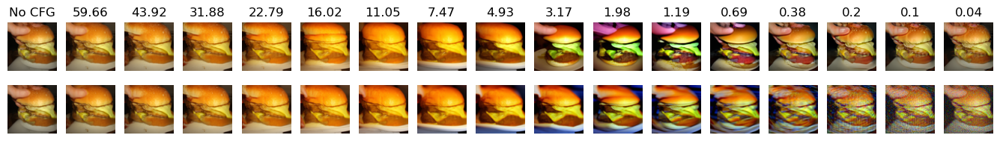

First row: step-wise EDM CFG
second row: step-wise Linear CFG


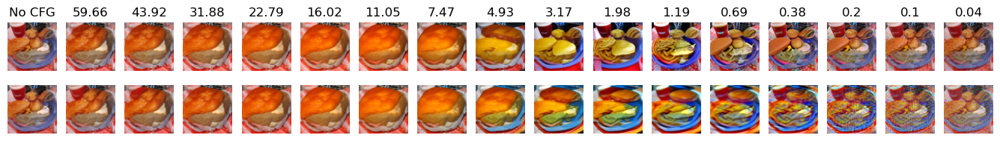

First row: step-wise EDM CFG
second row: step-wise Linear CFG


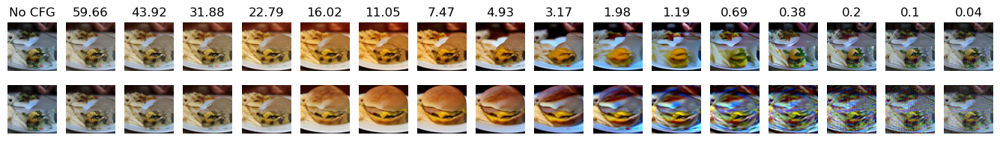

First row: step-wise EDM CFG
second row: step-wise Linear CFG


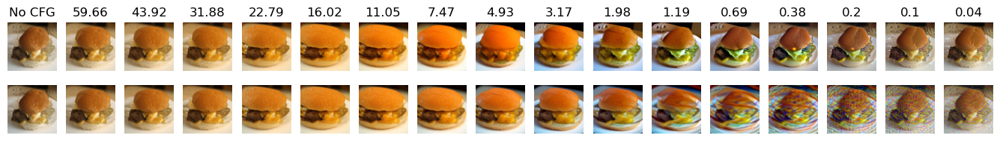

First row: step-wise EDM CFG
second row: step-wise Linear CFG


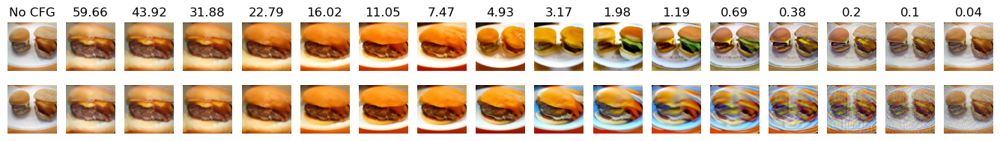

First row: step-wise EDM CFG
second row: step-wise Linear CFG


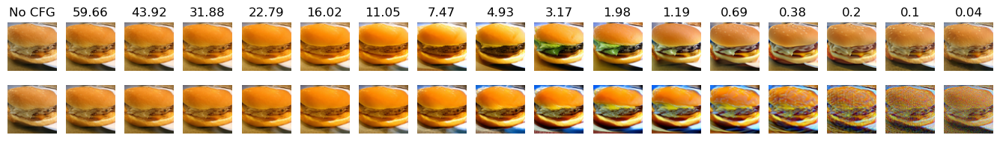

First row: step-wise EDM CFG
second row: step-wise Linear CFG


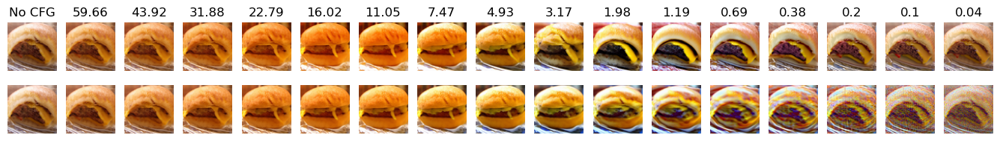

First row: step-wise EDM CFG
second row: step-wise Linear CFG


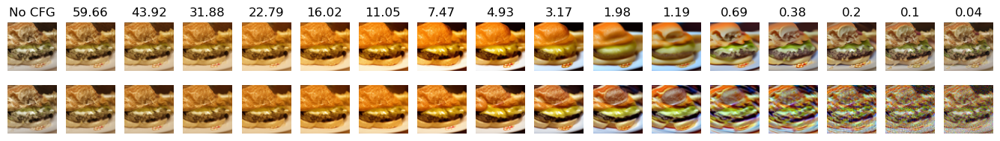

First row: step-wise EDM CFG
second row: step-wise Linear CFG


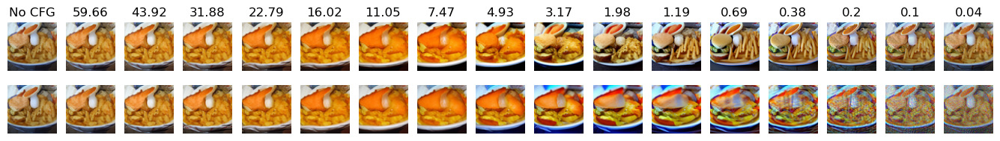

First row: step-wise EDM CFG
second row: step-wise Linear CFG


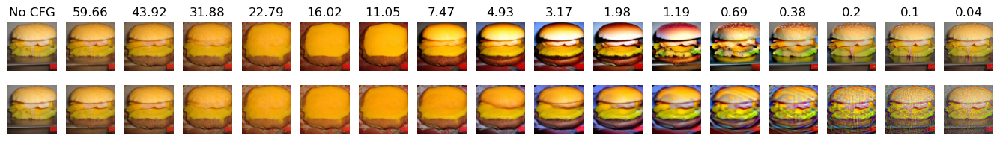

In [16]:
# Ready to visualize
for i in range(num_show):
    print('First row: step-wise EDM CFG')
    print('second row: step-wise Linear CFG')
    plt.figure(figsize=(20,2))
    plt.subplot(2,len(sample_list_edm)+1, 1)
    plt.imshow(normalize_image(denoised_intermediates_EDM_cond[-1][i].permute(1,2,0)))
    plt.title('No CFG')
    plt.axis('off')

    plt.subplot(2,len(sample_list_edm)+1, 1+len(sample_list_edm)+1)
    plt.imshow(normalize_image(denoised_intermediates_EDM_cond[-1][i].permute(1,2,0)))
    plt.axis('off')
    
    
    for j in range(len(sample_list_edm)-3):
        edm_cfg_sample = sample_list_edm[j][i]
        linear_cfg_sample = sample_list_linear[j][i]
        plt.subplot(2,len(sample_list_edm)+1, j+1+1)
        plt.imshow(normalize_image(edm_cfg_sample.permute(1,2,0)))
        plt.title(str(round(sigma_list[j+1],2)))
        plt.axis('off')
        plt.subplot(2,len(sample_list_edm)+1, j+1+1+len(sample_list_edm)+1)
        plt.imshow(normalize_image(linear_cfg_sample.permute(1,2,0)))
        plt.axis('off')
    plt.show()

### From the above results, it is clear that for high to moderate noise levels, the effects of linear CFG match those of the actual nonlinear CFG. As noise level decreases, their effects start to diverge since diffusion models start to exhibit high linearity. Moreover, the CFG in the linear regime (high to moderate noise levels) largely reshapes the overall structures of the generated samples. In contrast, in the nonlinear regime (low noise levels), CFG mainly enhances the finer image details while the overall structure remains unchanged. It should be noted that there in fact exists a third stage, i.e., when the noise level is extremely small, and where CFG has approximately no effect. This is expected, since when noise is very small, both conditional and unconditonal denoisers can well denoise the image, hence their difference, i.e., the CFG guidance will be very small as well, leading to negligible guiding effects.

### 2. Lastly, we will visualize CFG's effects when being applied to several time steps jointly in the linear regime. We will also visualize the guiding effects of (i) mean-shift guidance, (ii) positive CPC guidance and (iii) negative CPC guidance, applying each of them independently in the linear regime. We summarize the results as follows: (i) the effects of linear CFG match those of the nonlinear CFG, (ii) mean-shift guidance dominates the effects of linear CFG, and (iii) positive and negative CPCs can lead to meaningful guiding effect as well.

100%|██████████| 20/20 [00:15<00:00,  1.25step/s]


Image0


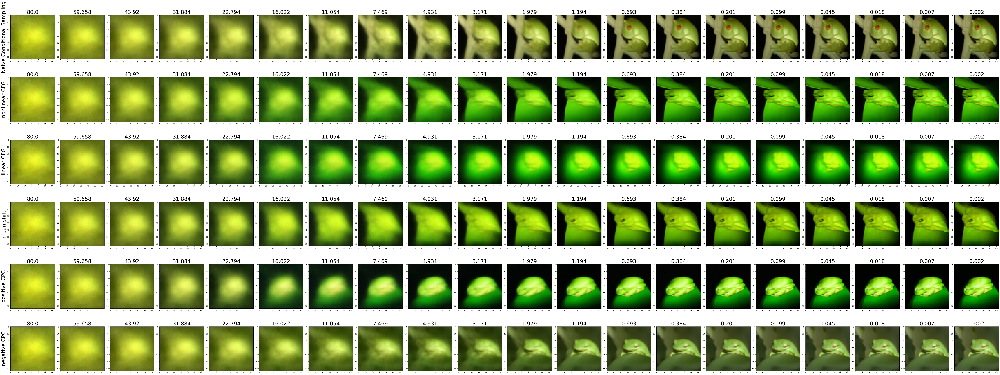

Image1


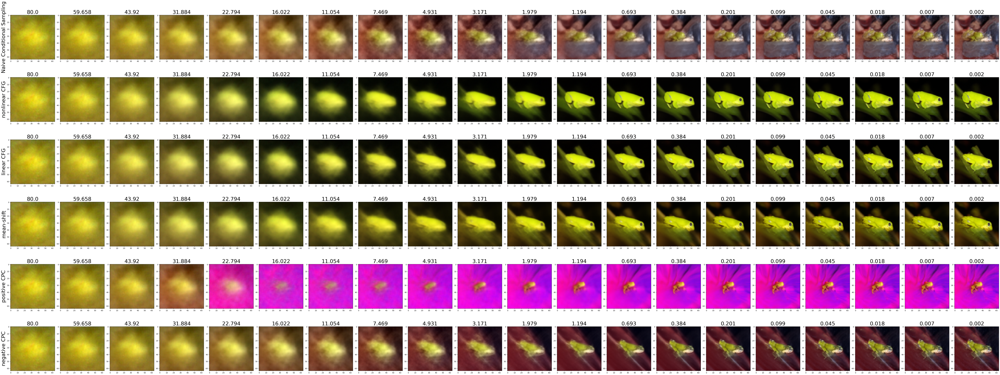

Image2


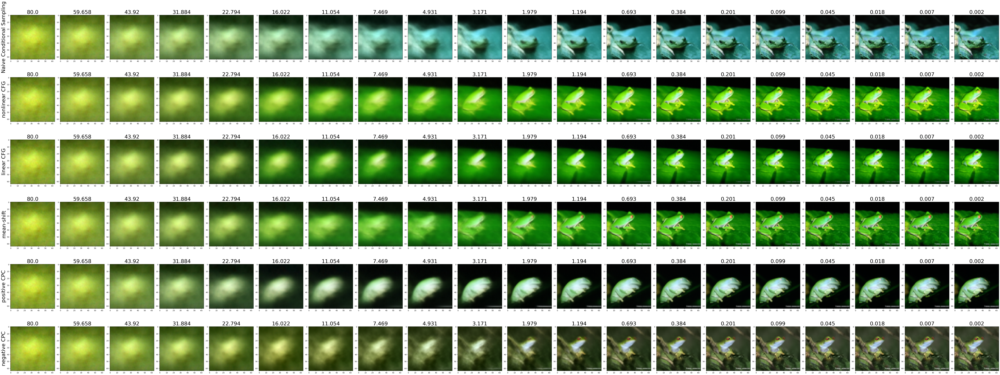

Image3


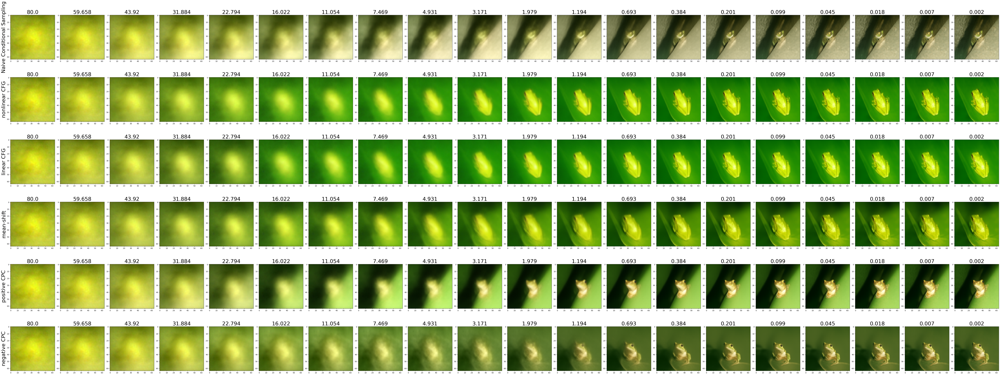

Image4


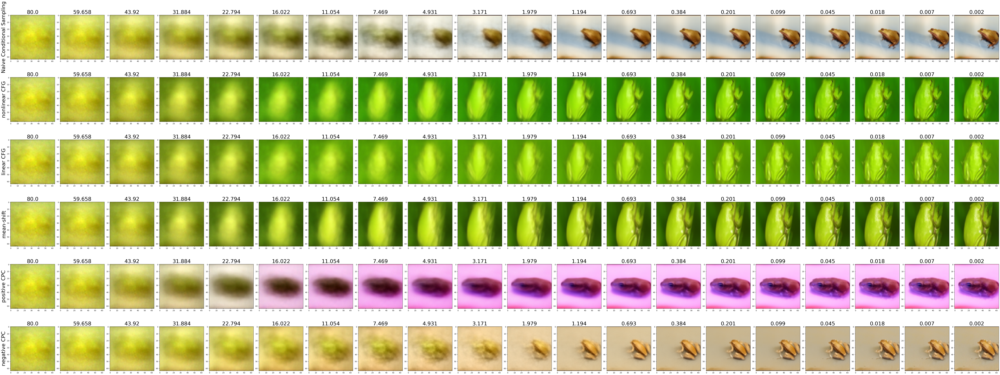

In [21]:
torch.manual_seed(0)

num_show = 5
num_steps = 20
num_channels = 3
resolution = 64
latents = torch.randn(num_show, num_channels, resolution, resolution).to(device)
guidance_strength = 10
interval = (80,20) #only apply CFG in the linear regime
class_idx = 31 #[0, 31, 64, 207, 430, 483, 504, 817, 933, 947]
guidance_strength_cpc = 30

# Build conditional linear model
mean_path_cond = 'Covariance_ImageNetGenerated/class_'+str(class_idx)+'/mean.pt'
covariance_path_cond = 'Covariance_ImageNetGenerated/class_'+str(class_idx)+'/covariance.pt'
mean_cond = torch.load(mean_path_cond, weights_only=False)
mean_cond = mean_cond.to(device)
U, S, Vh = torch.load(covariance_path_cond, weights_only=False)
U = U.to(device)
S = S.to(device)
Vh = Vh.to(device)
covariance_cond = U, S, Vh
Gaussian_model_cond = multi_gaussian(mean_cond, covariance_cond, low_rank=rank).to(device)

sigma_list, _, denoised_intermediates_EDM_cond = generate_image(net_cond, latents, num_steps=num_steps, S_noise=0, class_idx=class_idx, device=device)
sigma_list, _, denoised_intermediates_EDM_cfg_cond, _ = generate_image_EDM_cfg_limited_interval(net_uncond, net_cond, latents , guidance_strength, interval[0], interval[1], num_steps=num_steps, class_idx=class_idx, device=device)
sigma_list, _, denoised_intermediates_EDM_cfg_cond_linear = generate_image_Gaussian_cpc_limited_interval(net_cond, Gaussian_model_cond, Gaussian_model_uncond, latents , interval[0], interval[1], guide_type='normal', guidance_strength=guidance_strength, num_steps=num_steps, class_idx=class_idx, device=device)
sigma_list, _, denoised_intermediates_EDM_cfg_cond_cpc_pos =  generate_image_Gaussian_cpc_limited_interval(net_cond, Gaussian_model_cond, Gaussian_model_uncond, latents , interval[0], interval[1], guide_type='pos', guidance_strength=guidance_strength_cpc, num_steps=num_steps, class_idx=class_idx, device=device)
sigma_list, _, denoised_intermediates_EDM_cfg_cond_cpc_neg =  generate_image_Gaussian_cpc_limited_interval(net_cond, Gaussian_model_cond, Gaussian_model_uncond, latents , interval[0], interval[1], guide_type='neg', guidance_strength=guidance_strength_cpc, num_steps=num_steps, class_idx=class_idx, device=device)
sigma_list, _, denoised_intermediates_EDM_cfg_cond_cpc_mean_shift =  generate_image_Gaussian_cpc_limited_interval(net_cond, Gaussian_model_cond, Gaussian_model_uncond, latents , interval[0], interval[1], guide_type='mean_shift', guidance_strength=guidance_strength, num_steps=num_steps, class_idx=class_idx, device=device)

for i in range(num_show):
    print('Image'+str(i))
    plt.figure(figsize=(num_steps*4,6*5))
    
    for j in range(len(denoised_intermediates_EDM_cond)):
        img = denoised_intermediates_EDM_cond[j][i]
        plt.subplot(6,len(denoised_intermediates_EDM_cond),j+1+0*len(denoised_intermediates_EDM_cond))
        plt.title(str(round(sigma_list[j], 3)), fontsize=30)
        plt.imshow(normalize_image(img.permute(1,2,0).detach().cpu()))
        if j==0:
            plt.ylabel('Naive Conditional Sampling', fontsize=30)
            
    for j in range(len(denoised_intermediates_EDM_cfg_cond)):
        img = denoised_intermediates_EDM_cfg_cond[j][i]
        plt.subplot(6,len(denoised_intermediates_EDM_cfg_cond),j+1+1*len(denoised_intermediates_EDM_cfg_cond))
        plt.title(str(round(sigma_list[j], 3)), fontsize=30)
        plt.imshow(normalize_image(img.permute(1,2,0).detach().cpu()))
        if j==0:
            plt.ylabel('nonlinear CFG', fontsize=30)
            
    for j in range(len(denoised_intermediates_EDM_cfg_cond_linear)):
        img = denoised_intermediates_EDM_cfg_cond_linear[j][i]
        plt.subplot(6,len(denoised_intermediates_EDM_cfg_cond_linear),j+1+2*len(denoised_intermediates_EDM_cfg_cond_linear))
        plt.title(str(round(sigma_list[j], 3)), fontsize=30)
        plt.imshow(normalize_image(img.permute(1,2,0).detach().cpu()))
        if j==0:
            plt.ylabel('linear CFG', fontsize=30)
            
    for j in range(len(denoised_intermediates_EDM_cfg_cond_cpc_mean_shift)):
        img = denoised_intermediates_EDM_cfg_cond_cpc_mean_shift[j][i]
        plt.subplot(6,len(denoised_intermediates_EDM_cfg_cond_cpc_mean_shift),j+1+3*len(denoised_intermediates_EDM_cfg_cond_cpc_mean_shift))
        plt.title(str(round(sigma_list[j], 3)), fontsize=30)
        plt.imshow(normalize_image(img.permute(1,2,0).detach().cpu()))
        if j==0:
            plt.ylabel('mean-shift', fontsize=30)
            
    for j in range(len(denoised_intermediates_EDM_cfg_cond_cpc_pos)):
        img = denoised_intermediates_EDM_cfg_cond_cpc_pos[j][i]
        plt.subplot(6,len(denoised_intermediates_EDM_cfg_cond_cpc_pos),j+1+4*len(denoised_intermediates_EDM_cfg_cond_cpc_pos))
        plt.title(str(round(sigma_list[j], 3)), fontsize=30)
        plt.imshow(normalize_image(img.permute(1,2,0).detach().cpu()))
        if j==0:
            plt.ylabel('positive CPC', fontsize=30)
            
    for j in range(len(denoised_intermediates_EDM_cfg_cond_cpc_neg)):
        img = denoised_intermediates_EDM_cfg_cond_cpc_neg[j][i]
        plt.subplot(6,len(denoised_intermediates_EDM_cfg_cond_cpc_neg),j+1+5*len(denoised_intermediates_EDM_cfg_cond_cpc_neg))
        plt.title(str(round(sigma_list[j], 3)), fontsize=30)
        plt.imshow(normalize_image(img.permute(1,2,0).detach().cpu()))
        if j==0:
            plt.ylabel('negative CPC', fontsize=30)
            
    plt.tight_layout()      
    plt.show()